## 3. Image compression using clustering

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
from datetime import timedelta
import imageio
import os
import pandas as pd

In [2]:
def assign_cluster(pixel, centroids, norm=2):
    if norm == 1:
        distances = np.sum(np.abs(pixel - centroids), axis=1)
    else:
        distances = np.linalg.norm(pixel - centroids, axis=1)
    return np.argmin(distances)

def adjust_centroids(pixels, cluster_assignments, k, norm=2):
    centroids = np.zeros((k, pixels.shape[1]))
    for cluster in range(k):
        cluster_points = pixels[cluster_assignments == cluster]
        if len(cluster_points) > 0:
            if norm == 1:
                centroids[cluster] = np.median(cluster_points, axis=0)
            else:
                centroids[cluster] = np.mean(cluster_points, axis=0)
    return centroids

def run_kmeans(pixels, k, max_iter=100, tol=1e-4, norm=2, trials=5):
    best_centroids = None
    best_cluster_assignments = None
    best_quality = float("inf")
    best_iterations = 0
    best_runtime = 0
    best_seed = None

    trial_results = []

    for trial in range(trials):
        start_time = time.monotonic()
        np.random.seed(trial)
        centroids = pixels[np.random.choice(pixels.shape[0], k, replace=False)]

        for iteration in range(max_iter):
            distances = (
                np.linalg.norm(pixels[:, np.newaxis] - centroids, axis=2)
                if norm == 2
                else np.sum(np.abs(pixels[:, np.newaxis] - centroids), axis=2)
            )
            cluster_assignments = np.argmin(distances, axis=1)
            new_centroids = adjust_centroids(pixels, cluster_assignments, k, norm)
            if np.linalg.norm(new_centroids - centroids) < tol:
                break
            centroids = new_centroids

        end_time = time.monotonic()
        distortion = np.sum((pixels - centroids[cluster_assignments]) ** 2)
        runtime = timedelta(seconds=end_time - start_time).total_seconds()
        trial_results.append((trial, distortion, iteration + 1, runtime))

        if distortion < best_quality:
            best_quality = distortion
            best_centroids = centroids
            best_cluster_assignments = cluster_assignments
            best_iterations = iteration + 1
            best_runtime = runtime
            best_seed = trial

    return (
        best_cluster_assignments,
        best_centroids,
        best_iterations,
        best_runtime,
        best_seed,
        trial_results,
    )
    
def reconstruct_image(cluster_assignments, centroids, original_shape):
    reconstructed = centroids[cluster_assignments].astype(np.uint8)
    return reconstructed.reshape(original_shape)

def load_image(image_path):
    image = imageio.v2.imread(image_path)
    if len(image.shape) == 2:
        image = np.stack([image] * 3, axis=-1)
    elif image.shape[2] == 4:
        image = image[:, :, :3]
    pixels = image.reshape(-1, 3)
    return pixels, image.shape

def save_image(image, output_path):
    imageio.imwrite(output_path, image)

def elbow_method(image_path, k_values, norm=2):
    pixels, _ = load_image(image_path)
    distortions = []

    for k in k_values:
        cluster_assignments, centroids, _, _, _, _ = run_kmeans(pixels, k, norm=norm, trials=5)
        distortion = np.sum((pixels - centroids[cluster_assignments]) ** 2)
        distortions.append(distortion)

    plt.plot(k_values, distortions, marker="o")
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("Distortion")
    plt.title(f"Elbow Method (norm={norm})")
    plt.show()

### Q1

In [ ]:
k_values = [3, 6, 12, 24, 48]
image_paths = [
    "q3_data/sea-turtle-400x225.png",
    "q3_data/football.bmp",
    "q3_data/firefox.png",
]

output_dir = "q3_data/kmeans_results"
os.makedirs(output_dir, exist_ok=True)

summary = []

for image_path in image_paths:
    pixels, original_shape = load_image(image_path)

    for k in k_values:
        (
            cluster_assignments,
            centroids,
            iterations,
            runtime,
            best_seed,
            trial_results,
        ) = run_kmeans(pixels, k, norm=2, trials=5)

        compressed_image = reconstruct_image(
            cluster_assignments, centroids, original_shape
        )

        output_path = os.path.join(
            output_dir, f"{os.path.basename(image_path).split('.')[0]}_k{k}_l2.png"
        )
        save_image(compressed_image, output_path)

        print(
            f"k = {k}: Best Seed={best_seed}, Iterations={iterations}, Time={runtime:.2f} seconds. Image saved to {output_path}"
        )

        summary.append((image_path, k, best_seed, iterations, runtime))

        print("\nTrial Details:")
        for trial in trial_results:
            print(
                f"  Seed={trial[0]}, Distortion={trial[1]:.2f}, Iterations={trial[2]}, Time={trial[3]:.2f}s"
            )

summary_df = pd.DataFrame(
    summary, columns=["Image", "k", "Best Seed", "Iterations", "Time (s)"]
)
print("\nSummary Table:")
print(summary_df)
summary_df.to_csv(os.path.join(output_dir, "kmeans_summary.csv"), index=False)


Processing q3_data/sea-turtle-400x225.png with k = 3 (L2 norm)...
k = 3: Best Seed=3, Iterations=19, Time=0.19 seconds. Image saved to kmeans_results/sea-turtle-400x225_k3_l2.png

Trial Details:
  Seed=0, Distortion=326174360.43, Iterations=34, Time=0.36s
  Seed=1, Distortion=326174360.43, Iterations=33, Time=0.33s
  Seed=2, Distortion=326174360.43, Iterations=36, Time=0.35s
  Seed=3, Distortion=326174349.42, Iterations=19, Time=0.19s
  Seed=4, Distortion=326174360.43, Iterations=35, Time=0.38s
Processing q3_data/sea-turtle-400x225.png with k = 6 (L2 norm)...
k = 6: Best Seed=0, Iterations=63, Time=0.99 seconds. Image saved to kmeans_results/sea-turtle-400x225_k6_l2.png

Trial Details:
  Seed=0, Distortion=157141002.30, Iterations=63, Time=0.99s
  Seed=1, Distortion=167213790.32, Iterations=76, Time=1.18s
  Seed=2, Distortion=157141002.30, Iterations=98, Time=1.49s
  Seed=3, Distortion=157141002.30, Iterations=59, Time=0.89s
  Seed=4, Distortion=157141002.30, Iterations=54, Time=0.81s


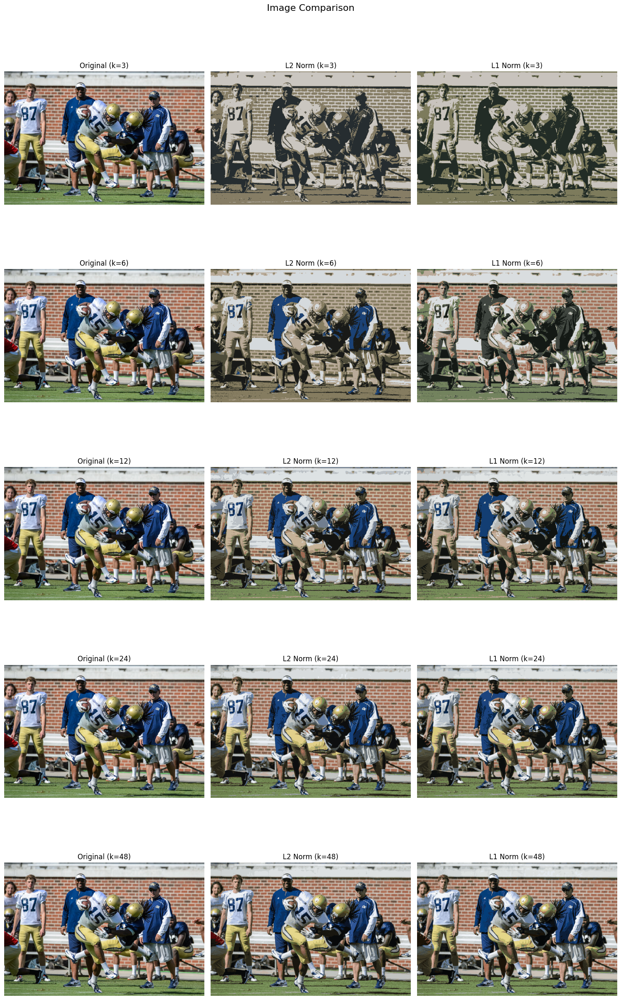

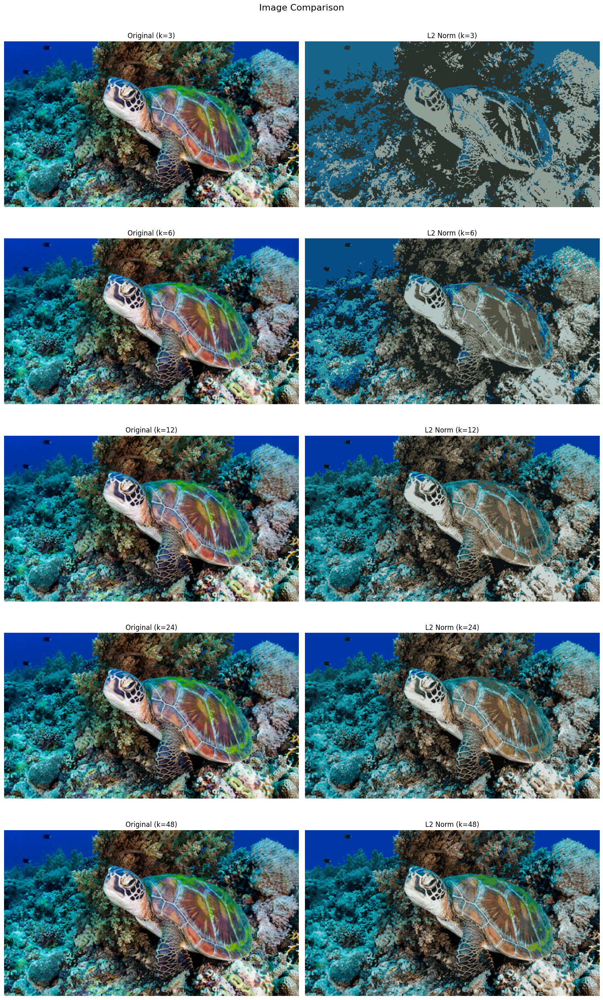

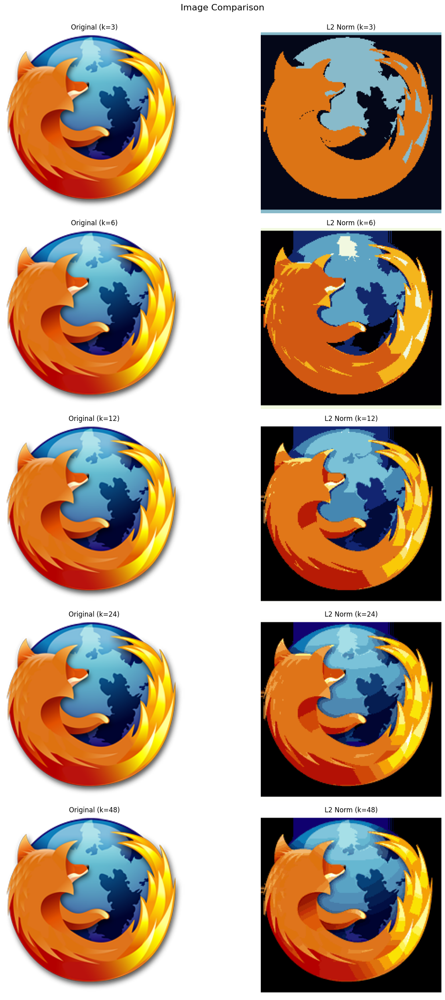

In [40]:
def plot_comparisons(image_path, k_values, l2_images, l1_images=None):
    original_image = imageio.v2.imread(image_path)
    num_k = len(k_values)
    cols = 3 if l1_images else 2
    rows = num_k

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    fig.suptitle("Image Comparison", fontsize=16, y=1.0)

    for i, k in enumerate(k_values):
        axes[i, 0].imshow(original_image)
        axes[i, 0].set_title(f"Original (k={k})")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(imageio.v2.imread(l2_images[i]))
        axes[i, 1].set_title(f"L2 Norm (k={k})")
        axes[i, 1].axis("off")

        if l1_images:
            axes[i, 2].imshow(imageio.v2.imread(l1_images[i]))
            axes[i, 2].set_title(f"L1 Norm (k={k})")
            axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

football_l2_images = [os.path.join("q3_data/kmeans_results", f"football_k{k}_l2.png") for k in [3, 6, 12, 24, 48]]
football_l1_images = [os.path.join("q3_data/kmeans_results", f"football_k{k}_l1.png") for k in [3, 6, 12, 24, 48]]
plot_comparisons(image_paths[1], [3, 6, 12, 24, 48], football_l2_images, football_l1_images)

sea_turtle_l2_images = [os.path.join("q3_data/kmeans_results", f"sea-turtle-400x225_k{k}_l2.png") for k in [3, 6, 12, 24, 48]]
plot_comparisons(image_paths[0], [3, 6, 12, 24, 48], sea_turtle_l2_images)

firefox_l2_images = [os.path.join("q3_data/kmeans_results", f"firefox_k{k}_l2.png") for k in [3, 6, 12, 24, 48]]
plot_comparisons(image_paths[2], [3, 6, 12, 24, 48], firefox_l2_images)



### Q2

In [ ]:
image_path = "q3_data/football.bmp"
pixels, original_shape = load_image(image_path)

output_dir = "q3_data/kmeans_results"
os.makedirs(output_dir, exist_ok=True)

for k in [3, 6, 12, 24, 48]:
    cluster_assignments, centroids, iterations, runtime, best_seed, trial_results = run_kmeans(pixels, k, norm=1, trials=5)

    compressed_image = reconstruct_image(cluster_assignments, centroids, original_shape)

    output_path = os.path.join(output_dir, f"{os.path.basename(image_path).split('.')[0]}_k{k}_l1.png")
    try:
        save_image(compressed_image, output_path)
        print(f"k = {k}: Best Seed={best_seed}, Iterations={iterations}, Time={runtime:.2f} seconds. Image saved to {output_path}")
    except Exception as e:
        print(f"Error saving image for k={k}: {e}")

    print("\nTrial Details:")
    for trial in trial_results:
        print(f"  Seed={trial[0]}, Distortion={trial[1]:.2f}, Iterations={trial[2]}, Time={trial[3]:.2f}s")

Processing q3_data/football.bmp with k = 3 (L1 norm)...
k = 3: Best Seed=0, Iterations=7, Time=0.22 seconds. Image saved to q3_data/kmeans_results/football_k3_l1.png

Trial Details:
  Seed=0, Distortion=655880477.00, Iterations=7, Time=0.22s
  Seed=1, Distortion=655885327.00, Iterations=17, Time=0.51s
  Seed=2, Distortion=657079233.00, Iterations=9, Time=0.27s
  Seed=3, Distortion=657079233.00, Iterations=18, Time=0.52s
  Seed=4, Distortion=655880477.00, Iterations=13, Time=0.35s
Processing q3_data/football.bmp with k = 6 (L1 norm)...
k = 6: Best Seed=4, Iterations=18, Time=0.78 seconds. Image saved to q3_data/kmeans_results/football_k6_l1.png

Trial Details:
  Seed=0, Distortion=358477325.00, Iterations=18, Time=0.85s
  Seed=1, Distortion=358241198.00, Iterations=15, Time=0.66s
  Seed=2, Distortion=358858541.00, Iterations=18, Time=0.77s
  Seed=3, Distortion=358002334.00, Iterations=28, Time=1.22s
  Seed=4, Distortion=346662937.00, Iterations=18, Time=0.78s
Processing q3_data/football

### Q3

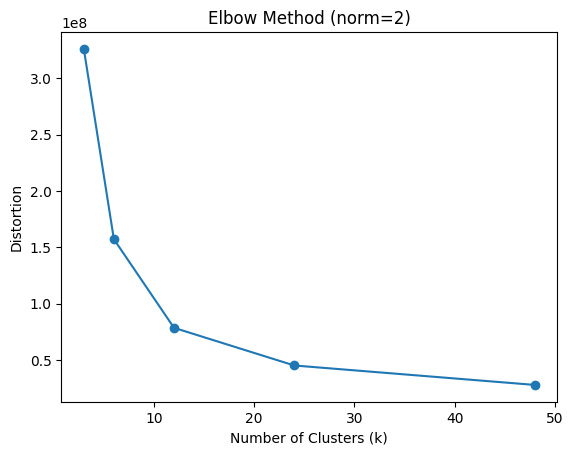

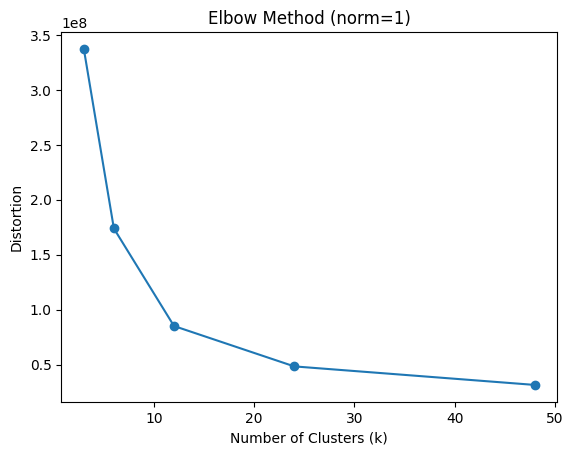

In [28]:
elbow_method(image_paths[0], k_values, norm=2)
elbow_method(image_paths[0], k_values, norm=1)